In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import json
from pathlib import Path
from tqdm import tqdm

from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

import torch
from diffusers import StableDiffusionPipeline

In [3]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [4]:
CONCEPT = 'dog'

# 프롬프트마다 NUM_IMAGES_PER_PROMPT장 생성
PROMPTS = [
    f"a photo of a {CONCEPT}",
]
PROMPT = PROMPTS[0]  # 단일 프롬프트 쓰는 셀 호환용

NUM_PROMPTS = len(PROMPTS)
NUM_IMAGES_PER_PROMPT = 400
NUM_IMAGES_TOTAL = NUM_PROMPTS * NUM_IMAGES_PER_PROMPT

SEED_BASE = 1000
TARGET_BLOCK = 'up_blocks.1.attentions.1.transformer_blocks.0.ff.net.0'
INJECT_BLOCK = 'up_blocks.1'

NUM_INFERENCE_STEPS = 50
CAPTURE_STEP = 10
GUIDANCE_SCALE = 7.5
NEGATIVE_PROMPT = ""
TOP_K = 100
ETA = 0.0


def prompt_dir_name(prompt_idx: int, prompt: str) -> str:
    slug = prompt.lower().replace(" ", "_").replace("/", "_")[:40]
    return f"prompt_{prompt_idx:02d}_{slug}"


In [5]:
if "pipe" not in globals():
    pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
    pipe = pipe.to(DEVICE)
    pipe.safety_checker = None
    pipe.set_progress_bar_config(disable=True)

In [6]:
# 타겟 블록 탐색
def get_target_block(unet, target_block_name: str):
    parts = target_block_name.split(".")
    def resolve(obj, remaining):
        if not remaining:
            return obj
        part, *rest = remaining
        child = obj[int(part)] if part.isdigit() else getattr(obj, part)
        return resolve(child, rest)
    return resolve(unet, parts)


# 배치 조건 확인
def _tensor_cond_batch_slice(t: torch.Tensor) -> torch.Tensor:
    if t.dim() >= 1 and t.shape[0] >= 2:
        return t[1]
    return t[0]

def _capture_activation(x):
    if isinstance(x, torch.Tensor):
        return _tensor_cond_batch_slice(x).clone().detach().cpu()
    if isinstance(x, (tuple, list)):
        tensors = [
            _tensor_cond_batch_slice(t).clone().detach().cpu()
            for t in x
            if isinstance(t, torch.Tensor)
        ]
        if len(tensors) == 1:
            return tensors[0]
        return tensors
    return x


# 특정 step에서 activation input/output 저장 - 일단 input만 사용할거야
def make_forward_activation_hook_at_step(capture_step: int):
    state = {"forward_i": -1, "value": None}
    
    def hook(module, input, output):
        state["forward_i"] += 1
        if state["forward_i"] != capture_step:
            return
        state["value"] = {
            "input": _capture_activation(input),
            "output": _capture_activation(output),
        }

    return hook, state

In [7]:
def save_up1_activations(up1_acts_per_image, save_dir: Path, *, meta: dict | None = None) -> Path:
    block_dir = Path(save_dir) / "up_blocks_1"
    block_dir.mkdir(parents=True, exist_ok=True)

    # RAM-safe path: write .npy memmap directly
    if isinstance(up1_acts_per_image, np.ndarray):
        stacked = up1_acts_per_image.astype(np.float32, copy=False)
    else:
        sample = np.asarray(up1_acts_per_image[0], dtype=np.float32)
        stacked = np.lib.format.open_memmap(
            block_dir / "act_maps_n_t_h_w.npy",
            mode="w+",
            dtype=np.float32,
            shape=(len(up1_acts_per_image), *sample.shape),
        )
        for i, arr in enumerate(up1_acts_per_image):
            stacked[i] = np.asarray(arr, dtype=np.float32)
        stacked.flush()

    payload_meta = {
        "seed_base": SEED_BASE,
        "block": INJECT_BLOCK,
        "num_inference_steps": NUM_INFERENCE_STEPS,
        "shape": list(stacked.shape),
        "format": "npy_memmap",
        **(meta or {}),
    }
    with open(block_dir / "meta.json", "w", encoding="utf-8") as f:
        json.dump(payload_meta, f, indent=2, ensure_ascii=False)

    print(f"  up_blocks.1 acts: {tuple(stacked.shape)} → {block_dir / 'act_maps_n_t_h_w.npy'}")
    return block_dir

In [8]:
def save_capture_run(
    images,
    activations_per_image,
    block_name: str,
    save_dir: Path,
    *,
    meta: dict | None = None,
) -> Path:
    save_dir = Path(save_dir)
    save_dir.mkdir(parents=True, exist_ok=True)
    images_dir = save_dir / "images"
    images_dir.mkdir(exist_ok=True)
    block_dir = save_dir / block_name.replace(".", "_")
    block_dir.mkdir(exist_ok=True)
    payload_meta = {
        "negative_prompt": NEGATIVE_PROMPT,
        "seed_base": SEED_BASE,
        "num_images": len(images),
        "target_block": TARGET_BLOCK,
        "num_inference_steps": NUM_INFERENCE_STEPS,
        "capture_step": CAPTURE_STEP,
        "guidance_scale": GUIDANCE_SCALE,
        **(meta or {}),
    }
    inputs_list, outputs_list = [], []
    for i, act in enumerate(activations_per_image):
        if act is None:
            raise ValueError(f"activations_per_image[{i}] is None")
        inputs_list.append(act["input"])
        outputs_list.append(act["output"])
        images[i].save(images_dir / f"{i:04d}.png")
    inputs_stacked = torch.stack(inputs_list)
    outputs_stacked = torch.stack(outputs_list)
    torch.save(
        {"inputs": inputs_stacked, "outputs": outputs_stacked},
        block_dir / "activations.pt",
    )
    with open(block_dir / "meta.json", "w", encoding="utf-8") as f:
        json.dump(payload_meta, f, indent=2, ensure_ascii=False)
    print(f"saved → {save_dir}")
    print(f"  images: {len(images)} | activations: {inputs_stacked.shape}")
    return save_dir


In [ ]:
# generator = torch.Generator(device="cpu")

# ff_block = get_target_block(pipe.unet, TARGET_BLOCK)
# inject_module = get_target_block(pipe.unet, INJECT_BLOCK)

# capture_hook, capture_state = make_forward_activation_hook_at_step(CAPTURE_STEP)
# up1_state = {"acts": []}

# def up1_capture_hook(_module, _inputs, output):
#     out = output[0] if isinstance(output, tuple) else output
#     feat = out[1] if out.shape[0] > 1 else out[0]
#     up1_state["acts"].append(feat.detach().float().cpu().numpy().astype(np.float32))

# ff_handle = ff_block.register_forward_hook(capture_hook)
# up1_handle = inject_module.register_forward_hook(up1_capture_hook)

# SAVE_DIR = Path(f"/project/dam/data/{CONCEPT}")
# SAVE_DIR.mkdir(parents=True, exist_ok=True)

# for p_idx, prompt in enumerate(PROMPTS):
#     images, activations_per_image = [], []
#     up1_memmap = None
#     up1_shape = None
#     pdir = SAVE_DIR / prompt_dir_name(p_idx, prompt)

#     for i in tqdm(range(NUM_IMAGES_PER_PROMPT), desc=f"prompt {p_idx}: {prompt[:40]}..."):
#     #         seed = SEED_BASE + global_idx
#         generator.manual_seed(seed)

#         capture_state["forward_i"] = -1
#         capture_state["value"] = None
#         up1_state["acts"] = []

#         result = pipe(
#             prompt=prompt,
#             negative_prompt=NEGATIVE_PROMPT,
#             num_inference_steps=NUM_INFERENCE_STEPS,
#             guidance_scale=GUIDANCE_SCALE,
#             num_images_per_prompt=1,
#             generator=generator,
#             output_type="pil",
#         )
#         img = result["images"][0] if isinstance(result, dict) else result.images[0]
#         images.append(img)
#         activations_per_image.append(capture_state["value"])
#         up1_arr = np.stack(up1_state["acts"], axis=0).astype(np.float32)
#         if up1_memmap is None:
#             up1_shape = up1_arr.shape
#             up1_dir = pdir / "up_blocks_1"
#             up1_dir.mkdir(parents=True, exist_ok=True)
#             up1_memmap = np.lib.format.open_memmap(
#                 up1_dir / "act_maps_n_t_h_w.npy",
#                 mode="w+",
#                 dtype=np.float32,
#                 shape=(NUM_IMAGES_PER_PROMPT, *up1_shape),
#             )
#         up1_memmap[i] = up1_arr
#         if (i + 1) % 25 == 0:
#             up1_memmap.flush()

#     save_capture_run(
#         images,
#         activations_per_image,
#         TARGET_BLOCK.replace(".", "_"),
#         pdir,
#         meta={"prompt": prompt, "prompt_idx": p_idx},
#     )
#     if up1_memmap is not None:
#         up1_memmap.flush()
#     save_up1_activations(
#         up1_memmap if up1_memmap is not None else [],
#         pdir,
#         meta={"prompt": prompt, "prompt_idx": p_idx},
#     )

# ff_handle.remove()
# up1_handle.remove()

# with open(SAVE_DIR / "prompts.json", "w", encoding="utf-8") as f:
#     json.dump(
#         {
#             "prompts": PROMPTS,
#             "num_images_per_prompt": NUM_IMAGES_PER_PROMPT,
#             "seed_base": SEED_BASE,
#         },
#         f,
#         indent=2,
#         ensure_ascii=False,
#     )
# print(f"done: {NUM_PROMPTS} prompts × {NUM_IMAGES_PER_PROMPT} images → {SAVE_DIR}")


In [10]:
def load_up1_maps(pdir: Path):
    npz_path = pdir / "up_blocks_1" / "act_maps_n_t_h_w.npz"
    npy_path = pdir / "up_blocks_1" / "act_maps_n_t_h_w.npy"
    if npy_path.exists():
        return np.load(npy_path, mmap_mode="r")
    if npz_path.exists():
        return np.load(npz_path)["act_maps_n_t_h_w"]
    raise FileNotFoundError(f"No up1 maps found in {pdir / 'up_blocks_1'}")

# 전체 프롬프트 로드
SAVE_DIR = Path(f"/project/dam/data/{CONCEPT}")

images, inputs_list, up1_list = [], [], []
prompt_index = []

for p_idx, prompt in enumerate(PROMPTS):
    pdir = SAVE_DIR / prompt_dir_name(p_idx, prompt)
    n = NUM_IMAGES_PER_PROMPT
    images.extend([Image.open(pdir / "images" / f"{i:04d}.png") for i in range(n)])
    inputs_list.append(
        torch.load(pdir / TARGET_BLOCK.replace(".", "_") / "activations.pt")["inputs"].cpu()
    )
    up1_list.append(
        load_up1_maps(pdir)
    )
    prompt_index.extend([p_idx] * n)

inputs = torch.cat(inputs_list, dim=0)
up1_all = np.concatenate(up1_list, axis=0)

prompt_index = np.array(prompt_index, dtype=np.int32)
N = len(images)

inputs.shape, up1_all.shape, prompt_index.shape

(torch.Size([400, 256, 1280]), (400, 51, 1280, 32, 32), (400,))

\begin{aligned}
&\text{직선의 방정식} \\
&w_1 x + w_2 y + b_i = 0 \\
&⇒ w_2 y = -(w_1 x + b_i) \\
&⇒ y = -\frac{w_1 x + b_i}{w_2}
\end{aligned}

In [11]:
# weight & bias 추출
ff = get_target_block(pipe.unet, TARGET_BLOCK)
ff_state = ff.state_dict()

W_geglu = ff_state["proj.weight"].cpu().float()   # (10240, 1280)
n_geglu_half = W_geglu.shape[0] // 2

W2 = W_geglu[n_geglu_half:]
b_geglu = ff_state["proj.bias"].cpu().float()
b2 = b_geglu[n_geglu_half:]

In [12]:
# inputs: (N, 256, 1280) — 이미지마다 mean_map·similarity·top-k를 각각 계산
N, seq_len, dim = inputs.shape
side = int(seq_len ** 0.5)
assert side * side == seq_len

K = 100 # 추출한 주요 뉴런 수

# (N, side, side, dim) → spatial mean → (N, seq_len)
h_3d = inputs.reshape(N, side, side, dim)
mean_map = h_3d.mean(dim=-1).reshape(N, seq_len)  # (N, 256)

# h: (N, 256, 1280) @ W2.T: (1280, 5120) → (N, 256, 5120)
neuron_acts = inputs @ W2.T

# spatial mean과의 유사도
similarity = (neuron_acts * mean_map.unsqueeze(-1)).sum(dim=1)  # (N, 5120)

similarity_mean = similarity.mean(dim=0)  # (5120,)
top_k_idx = similarity_mean.topk(K).indices  # 0~5119 범위

In [13]:
# w & b도 해당 뉴런들만 추출
W2_topk = W2#[top_k_idx, :]
b2_topk = b2#[top_k_idx]

print(W2_topk.shape, b2_topk.shape)

torch.Size([5120, 1280]) torch.Size([5120])


In [14]:
# 각 토큰이 hyperplane에서 얼마나 떨어져 있는지
signed_dist = inputs @ W2_topk.T
signed_dist = signed_dist + b2_topk
signed_dist = signed_dist / W2_topk.norm(dim=-1)

signed_dist.shape

torch.Size([400, 256, 5120])

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# 1. PCA
h_all = inputs.reshape(-1, inputs.shape[-1]).cpu().numpy()
pca_act = PCA(n_components=2)
h_2d = pca_act.fit_transform(h_all)

# 범주
x_min, x_max = h_2d[:, 0].min(), h_2d[:, 0].max()
y_min, y_max = h_2d[:, 1].min(), h_2d[:, 1].max()
pad = 0.05
x_lim = (x_min - pad*(x_max-x_min), x_max + pad*(x_max-x_min))
y_lim = (y_min - pad*(y_max-y_min), y_max + pad*(y_max-y_min))
x_range = np.linspace(x_lim[0], x_lim[1], 300)

# 2. w_j, b_j를 PCA 공간으로 변환
def to_2d(w_j, b_j):
    w_2d = pca_act.components_ @ w_j.cpu().numpy()
    b_2d = float(w_j.cpu().numpy() @ pca_act.mean_) + float(b_j)
    return w_2d, b_2d

# 3. 교점 계산
intersections = []
for i in range(K):
    for j in range(i+1, K):
        w_2d_i, b_2d_i = to_2d(W2_topk[i], b2_topk[i])
        w_2d_j, b_2d_j = to_2d(W2_topk[j], b2_topk[j])

        A = np.array([w_2d_i, w_2d_j])
        b = np.array([-b_2d_i, -b_2d_j])

        if abs(np.linalg.det(A)) < 1e-8:
            continue

        pt = np.linalg.solve(A, b)
        if x_lim[0] < pt[0] < x_lim[1] and y_lim[0] < pt[1] < y_lim[1]:
            intersections.append(pt)

intersections = np.array(intersections) if intersections else np.zeros((0, 2))

# # 4. 시각화 — 뉴런 k마다
# sd_flat = signed_dist.reshape(-1, K).cpu().numpy()

# w_2d_all, b_2d_all = [], []
# for j in range(K):
#     w, b = to_2d(W2_topk[j], b2_topk[j])
#     w_2d_all.append(w)
#     b_2d_all.append(b)

# ncols = 10
# nrows = int(np.ceil(K / ncols))
# fig, axes = plt.subplots(nrows, ncols, figsize=(2.2 * ncols, 2.2 * nrows), squeeze=False)
# axes_flat = axes.flatten()

# def _plot_boundary(ax, w_2d, b_2d, *, lw=0.5, alpha=0.3, color='k'):
#     if abs(w_2d[1]) < 1e-8:
#         if abs(w_2d[0]) > 1e-8:
#             x0 = -b_2d / w_2d[0]
#             if x_lim[0] <= x0 <= x_lim[1]:
#                 ax.axvline(x0, color=color, lw=lw, alpha=alpha)
#         return
#     y_line = -(w_2d[0] * x_range + b_2d) / w_2d[1]
#     mask = (y_line >= y_lim[0]) & (y_line <= y_lim[1])
#     if mask.any():
#         ax.plot(x_range[mask], y_line[mask], '-', color=color, lw=lw, alpha=alpha)

# for k, ax in enumerate(axes_flat[:K]):
#     sc = ax.scatter(
#         h_2d[:, 0], h_2d[:, 1],
#         c=sd_flat[:, k], cmap='RdBu', s=2, alpha=0.35, vmin=-3, vmax=3,
#     )
#     for j in range(K):
#         if j == k:
#             _plot_boundary(ax, w_2d_all[j], b_2d_all[j], lw=1.2, alpha=0.9, color='crimson')
#         else:
#             _plot_boundary(ax, w_2d_all[j], b_2d_all[j], lw=0.4, alpha=0.25, color='k')
#     ax.set_xlim(x_lim)
#     ax.set_ylim(y_lim)
#     ax.axis('off')
#     ax.set_title(f'neuron {k}', fontsize=8)
#     ax.tick_params(labelsize=6)

# for ax in axes_flat[K:]:
#     ax.axis('off')

# plt.show()

print('PCA explained variance:', pca_act.explained_variance_ratio_)
print('교점 수:', len(intersections))

PCA explained variance: [0.14659297 0.05903926]
교점 수: 1047


# 세 평면 → 8구역

In [287]:
# Step 1: 평면 100개 개별 점수 (balance score)
scores = []
for j in range(len(W2_topk)):
    dist = W2_topk[j].cpu() @ inputs.mean(dim=1).cpu().T + b2_topk[j].cpu()
    balance = min((dist > 0).sum(), (dist <= 0).sum()) / N
    scores.append(balance)

# Step 2: 상위 20개로 압축
top20 = torch.tensor(scores).topk(5120).indices.tolist()

# Step 3: top20 중 서로 독립적인 3개 greedy 선택
selected = []
num_planes = 3
for _ in range(num_planes):
    best_j, best_score = None, -1
    for j in top20:
        if j in selected:
            continue
        if len(selected) == 0:
            score = scores[j]  # 첫 번째는 balance만 보기
        else:
            w_j = W2_topk[j].cpu()
            cos_sims = [abs(torch.nn.functional.cosine_similarity(
                w_j.unsqueeze(0), W2_topk[s].cpu().unsqueeze(0)
            )).item() for s in selected]
            independence = 1 - max(cos_sims)
            score = scores[j] * independence
        if score > best_score:
            best_score, best_j = score, j
    selected.append(best_j)

print(f'선택된 평면: {selected}')

선택된 평면: [3658, 4370, 2888]


In [288]:
# rng = np.random.default_rng(39)
# planes = rng.choice(K, size=3, replace=False)
planes = selected
print(planes)

[3658, 4370, 2888]


In [289]:
H = inputs.mean(dim=1)                       # (N, 1280)
W3, b3 = W2_topk[planes], b2_topk[planes]    # (3,1280), (3,)
s = (H @ W3.T + b3) / W3.norm(dim=-1)        # (N, 3)  실제 부호거리

In [290]:
num_planes = s.shape[1]
bits = (s > 0).int()  # (N, num_planes)

if num_planes < 20:  # numpy bitpacking이 64비트까지 안전
    code = bits.cpu().numpy()
    code = np.packbits(code, axis=1, bitorder='little').squeeze()  # 비트 순서를 LSB-first
    code = code.astype(int)
    if code.shape == ():  # 단일값 예외 처리
        code = np.array([int(code)])
    else:
        code = code[: , 0] if code.ndim == 2 else code
else:
    # 만약 평면이 20개 이상이고 packbits로 int로 못만들정도로 크면 row별로 직접 변환
    code = bits.cpu().numpy()
    code_val = np.zeros(code.shape[0], dtype=int)
    for i in range(num_planes):
        code_val += code[:,i] << i
    code = code_val

In [291]:
num_planes = s.shape[1]
num_regions = 2 ** num_planes
counts = np.bincount(code, minlength=num_regions)
for r in range(num_regions):
    print(f"구역 {r:03b} ({r}): {counts[r]:3d}장")

구역 000 (0):  10장
구역 001 (1):  14장
구역 010 (2):  11장
구역 011 (3):  15장
구역 100 (4):  16장
구역 101 (5):  10장
구역 110 (6):  13장
구역 111 (7):  11장


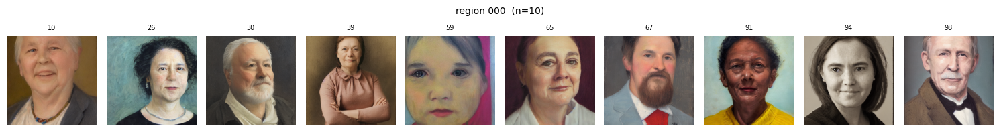

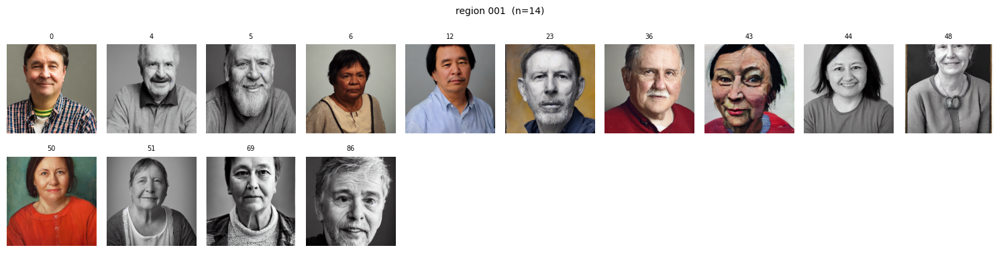

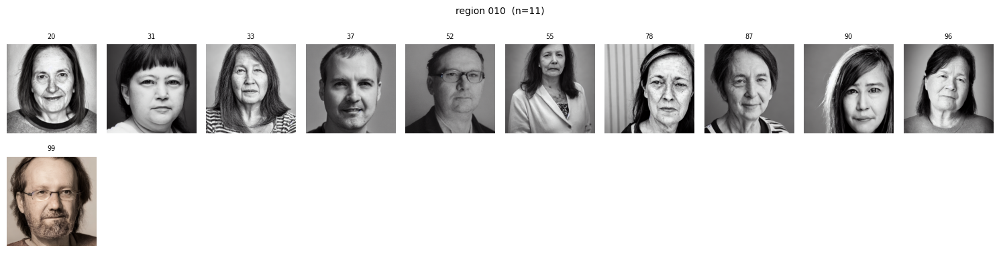

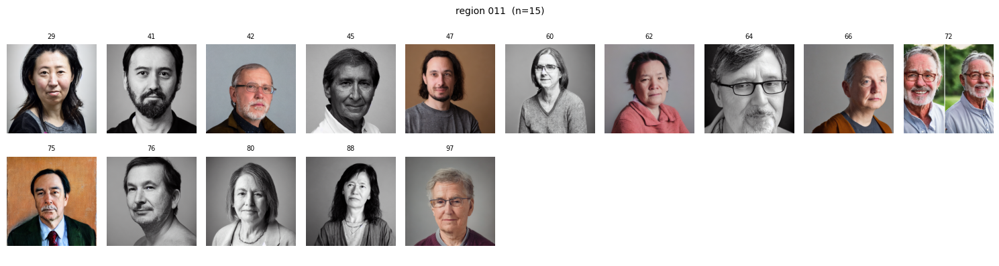

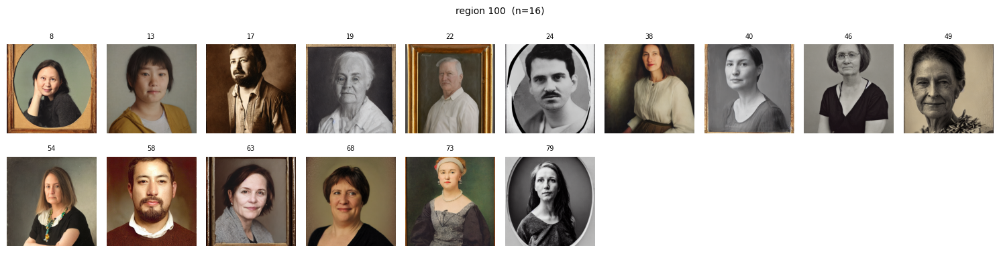

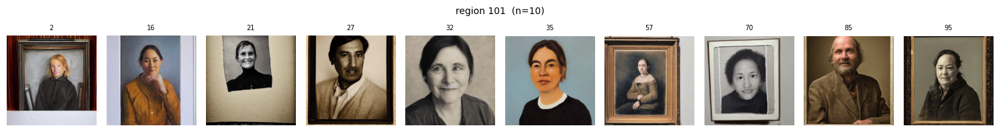

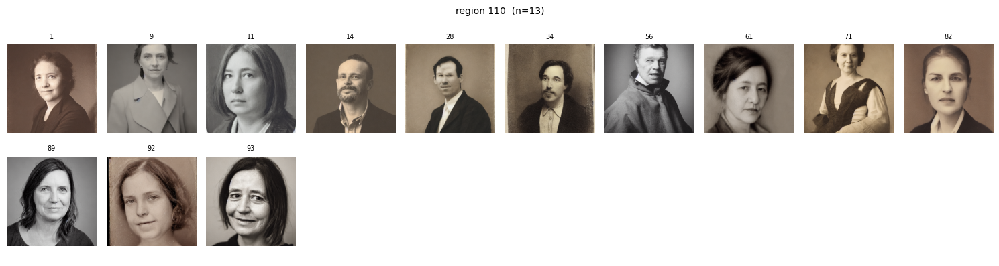

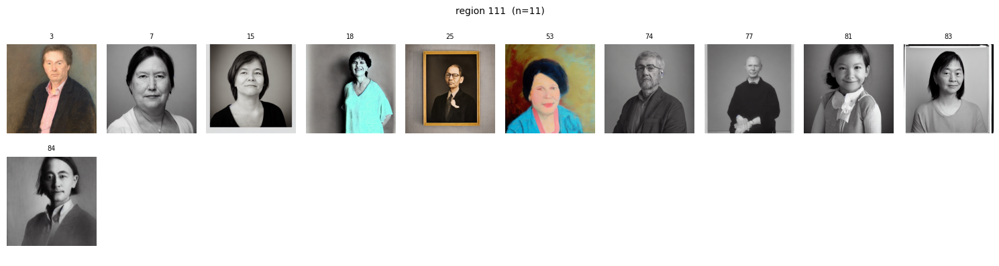

In [292]:
for r in range(num_regions):
    idxs = np.where(code == r)[0]
    if len(idxs) == 0:
        continue
    imgs_per_row = 10
    total_imgs = len(idxs)
    ncols = min(total_imgs, imgs_per_row)
    nrows = (total_imgs + imgs_per_row - 1) // imgs_per_row
    fig, axes = plt.subplots(nrows, ncols, figsize=(1.5*ncols, 2*nrows))
    axes = np.array(axes).reshape(nrows, ncols)

    for idx, i in enumerate(idxs):
        row = idx // imgs_per_row
        col = idx % imgs_per_row
        ax = axes[row, col]
        ax.imshow(np.array(images[i]))
        ax.axis("off")
        ax.set_title(str(i), fontsize=7)
 
    for eidx in range(total_imgs, nrows * ncols):
        row = eidx // imgs_per_row
        col = eidx % imgs_per_row
        axes[row, col].axis('off')
    bin_format = f"0{num_planes}b"
    fig.suptitle(f"region {format(r, bin_format)}  (n={len(idxs)})", fontsize=10)
    plt.tight_layout(); plt.show()

## 특정 region으로 concept direction 만들어서 편집해보기

In [ ]:
region = 1
idxs = np.where(code == region)[0]
act_c = up1_all[idxs]
act_b = up1_all[~np.isin(np.arange(len(up1_all)), idxs)]

print(act_c.shape, act_b.shape)

(23, 51, 1280, 32, 32) (77, 51, 1280, 32, 32)


In [64]:
act_c = torch.from_numpy(np.asarray(act_c.mean(axis=0)))
act_b = torch.from_numpy(np.asarray(act_b.mean(axis=0)))
concept_direction = act_c - act_b
# concept_direction = concept_direction / concept_direction.norm()

In [58]:
def _steering_delta_chw(d_np, step_idx, C, H, W):
    d = np.asarray(d_np, dtype=np.float32)
    if d.shape == (C, H, W):
        return d
    if d.ndim == 4 and d.shape[1:] == (C, H, W):
        return d[min(step_idx, d.shape[0] - 1)]
    raise ValueError(f"concept_direction {d.shape}, expected ({C},{H},{W}) or (T,{C},{H},{W})")


def _make_forward_steering_hook(concept_direction, alpha, num_steps):
    d_np = np.asarray(concept_direction, dtype=np.float32)
    step = [0]

    def _hook(_module, _inputs, output):
        out = output[0] if isinstance(output, tuple) else output
        si = step[0]
        step[0] += 1
        _, C, H, W = out.shape
        g = _steering_delta_chw(d_np, si, C, H, W)
        dt = torch.as_tensor(g, device=out.device, dtype=out.dtype)
        alpha_t = alpha * (1.0 - si / max(num_steps - 1, 1))
        new_out = out.clone()
        if new_out.shape[0] >= 2:
            new_out[1] = out[1] + alpha_t * dt
        else:
            new_out = out + alpha_t * dt
        return (new_out,) + tuple(output[1:]) if isinstance(output, tuple) else new_out

    return _hook


def generate_with_concept_direction(prompt, seed, concept_direction, alpha, num_steps=None):
    n_steps = num_steps or NUM_INFERENCE_STEPS
    pipe.scheduler.set_timesteps(n_steps, device=DEVICE)
    actual_steps = len(pipe.scheduler.timesteps)
    blk = get_target_block(pipe.unet, INJECT_BLOCK)
    blk._forward_hooks.clear()
    hook_fn = _make_forward_steering_hook(concept_direction, alpha, actual_steps)
    handle = blk.register_forward_hook(hook_fn)
    try:
        gen = torch.Generator(device="cpu").manual_seed(seed)
        with torch.inference_mode():
            result = pipe(
                prompt=prompt,
                negative_prompt=NEGATIVE_PROMPT,
                num_inference_steps=n_steps,
                guidance_scale=GUIDANCE_SCALE,
                generator=gen,
            )
    finally:
        handle.remove()
    return result.images[0] if hasattr(result, "images") else result["images"][0]

In [ ]:
TEST_PROMPT = 'a photo of a dog'
STEER_SEED_BASE = 1000
STEER_ALPHA = [0, 1, 2, 3, 4, 5]

# # seed 별로 생성
# NUM_STEER_IMAGES = 10
# steered_imgs = []
# for seed in range(STEER_SEED_BASE, STEER_SEED_BASE + NUM_STEER_IMAGES):
#     img = generate_with_concept_direction(
#         TEST_PROMPT, seed, concept_direction, STEER_ALPHA
#     )
#     steered_imgs.append((seed, img))
#     print(f"seed={seed} done")

# alpha별로 생성
steered_imgs = []
for alpha in STEER_ALPHA:
    img = generate_with_concept_direction(
        TEST_PROMPT, STEER_SEED_BASE, concept_direction, alpha
    )
    steered_imgs.append((alpha, img))
    print(f"alpha={alpha} done    ", end='\r')
print('Generation Complete !!')

n = len(steered_imgs)
ncols = min(n, 10) if n else 1
nrows = (n + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(2*ncols, 3*nrows))
for ax, (alpha, img) in zip(np.atleast_1d(axes).flat, steered_imgs):
    ax.imshow(img)
    ax.set_title(f"α={alpha}", fontsize=10)
    ax.axis("off")
for ax in np.atleast_1d(axes).flat[n:]:
    ax.axis("off")
fig.suptitle(f'"{TEST_PROMPT}" — steered ({INJECT_BLOCK})', fontsize=11)
plt.tight_layout()
plt.show()

In [ ]:
TEST_PROMPT = 'a photo of an animal'
STEER_SEED_BASE = 1000
STEER_ALPHA = [0, 2, 5, 8, 10]
NUM_STEER_IMAGES = 10                      # seed 개수 (= 열 수)

seeds = list(range(STEER_SEED_BASE, STEER_SEED_BASE + NUM_STEER_IMAGES))

# alpha(행) × seed(열) 그리드로 생성
grid_imgs = {}                             # (alpha, seed) -> img
for alpha in STEER_ALPHA:
    for seed in seeds:
        grid_imgs[(alpha, seed)] = generate_with_concept_direction(
            TEST_PROMPT, seed, concept_direction, alpha
        )
        print(f"alpha={alpha} seed={seed} done\t", end='\r')
print('Generation Complete !!\t\t\t')

# 시각화: row = alpha, col = seed
nrows, ncols = len(STEER_ALPHA), len(seeds)
fig, axes = plt.subplots(nrows, ncols, figsize=(2*ncols, 2.4*nrows), squeeze=False)
for i, alpha in enumerate(STEER_ALPHA):
    for j, seed in enumerate(seeds):
        ax = axes[i, j]
        ax.imshow(grid_imgs[(alpha, seed)])
        ax.axis("off")
        if i == 0:
            ax.set_title(f"seed={seed}", fontsize=9)        # 열 헤더
    axes[i, 0].set_ylabel(f"α={alpha}", fontsize=10, rotation=0,
                          labelpad=25, va='center')         # 행 헤더

fig.suptitle(f'"{TEST_PROMPT}" — steered ({INJECT_BLOCK})', fontsize=12)
plt.tight_layout()
plt.show()

In [67]:
# images[1]

## 특정 region에 맞을 것 같은 이미지를 생성해서 해당 영역으로 들어가는지 확인해보기

In [273]:
framed_prompt = "a close-up front-facing photo of a dog"
framed_acts = []
framed_images = []

block = get_target_block(pipe.unet, TARGET_BLOCK)
block._forward_pre_hooks.clear()
block._forward_hooks.clear()

for seed in tqdm(range(10)):
    act_state = {}

    def framed_pre_hook(module, args):
        x = args[0]
        act_state["act"] = x[1].detach().cpu()  # (256, 1280) — 매 step마다 덮어씀

    handle = block.register_forward_pre_hook(framed_pre_hook)
    try:
        generator = torch.Generator(device="cpu").manual_seed(seed)
        result = pipe(
            prompt=framed_prompt,
            num_inference_steps=NUM_INFERENCE_STEPS,
            guidance_scale=GUIDANCE_SCALE,
            generator=generator,
            output_type="pil",
        )
    finally:
        handle.remove()

    framed_images.append(result.images[0])
    framed_acts.append(act_state["act"].mean(dim=0))  # (1280,)

framed_acts = torch.stack(framed_acts)  # (10, 1280)

# 선택된 평면들로 region 분류
selected_planes = selected
print(selected_planes)

def get_region(act, planes):
    bits = []
    for j in planes:
        score = W2_topk[j].cpu() @ act + b2_topk[j].cpu()
        bits.append(1 if score > 0 else 0)
    return "".join(map(str, bits))

for i, act in enumerate(framed_acts):
    region = get_region(act, selected_planes)
    print(f"seed {i}: region {region}")

100%|██████████| 10/10 [00:52<00:00,  5.28s/it]

[3089, 1406, 252]
seed 0: region 110
seed 1: region 100
seed 2: region 110
seed 3: region 110
seed 4: region 110
seed 5: region 010
seed 6: region 100
seed 7: region 000
seed 8: region 110
seed 9: region 110


In [262]:
bits = []
for j in selected_planes:
    score = W2_topk[j].cpu() @ act + b2_topk[j].cpu()
    bits.append(1 if score > 0 else 0)
    t = "".join(map(str, bits))
    print(t)

1
11
110


In [271]:
# (1280,)@(1280,)
# W2_topk[j].shape
W2_topk[j].cpu() @ act + b2_topk[j]

tensor(-0.8690)

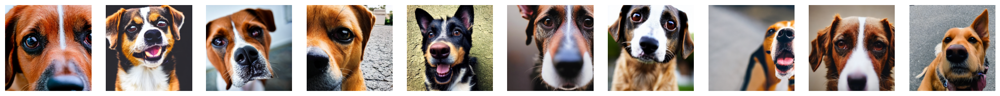

In [274]:
n_imgs = len(framed_images)
n_cols = 10
n_rows = (n_imgs + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(2 * n_cols, 2 * n_rows))

if n_rows == 1 and n_cols == 1:
    axes = np.array([[axes]])
elif n_rows == 1:
    axes = np.expand_dims(axes, axis=0)
elif n_cols == 1:
    axes = np.expand_dims(axes, axis=1)

for i in range(n_rows * n_cols):
    row, col = divmod(i, n_cols)
    ax = axes[row, col]
    if i < n_imgs:
        img = framed_images[i]
        ax.imshow(np.array(img))
    ax.axis('off')
plt.tight_layout()
plt.show()

# 고정 plane 2개와 기준점 2개 찾기

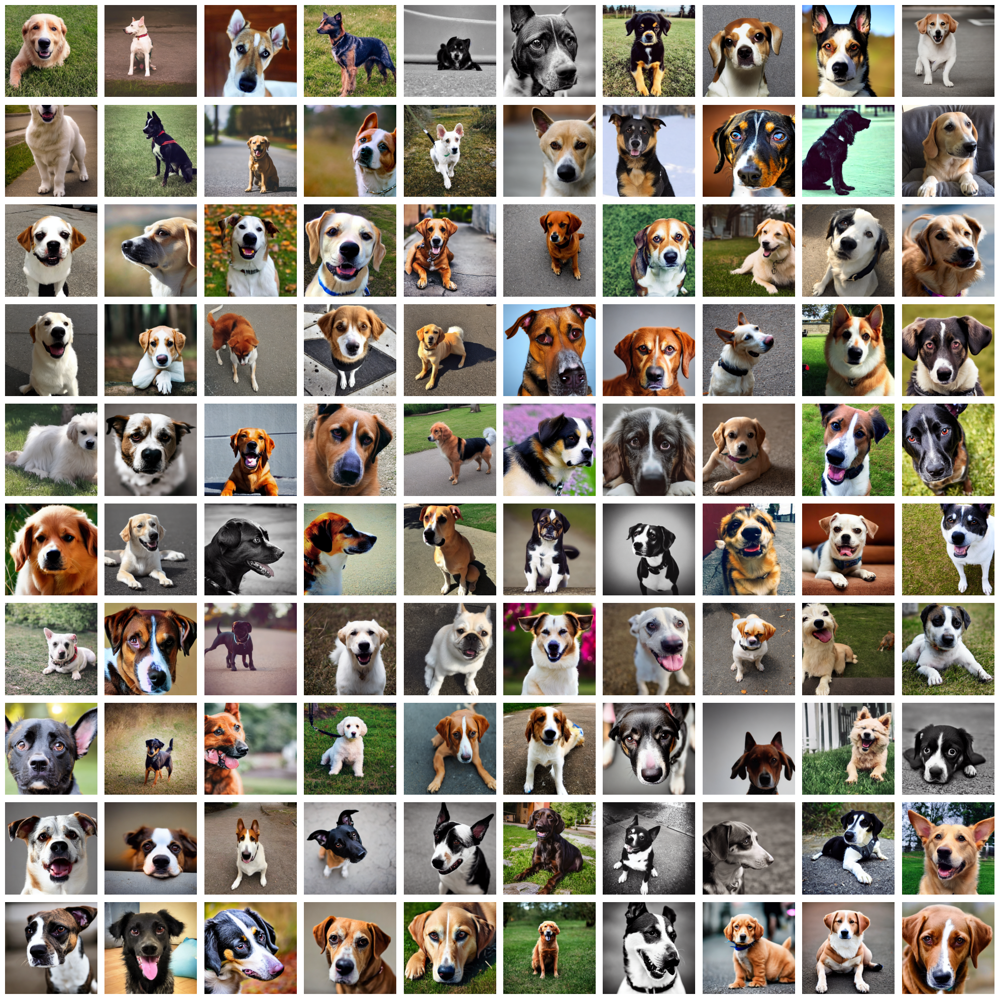

In [89]:
# images에 있는 첫 100개 이미지를 10x10 그리드로 시각화
import matplotlib.pyplot as plt

n_images = 100
n_row, n_col = 10, 10

fig, axes = plt.subplots(n_row, n_col, figsize=(20, 20))
for idx in range(n_images):
    ax = axes[idx // n_col, idx % n_col]
    img = images[idx]
    if hasattr(img, 'permute'):  # torch.Tensor
        img_disp = img.permute(1,2,0).cpu().numpy()
    else:  # PIL Image or numpy array
        img_disp = np.array(img)
    ax.imshow(img_disp)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [119]:
# 두 이미지를 골라(h0, h1), h0은 각 hyperplane(z1)에, h1은 다른 hyperplane(z2)에 각각 정사영시켜
# 모든 (z1, z2) 쌍 중 정사영점 사이 거리가 가장 큰 쌍을 찾기

idx0 = 21   # 첫 이미지 인덱스 (임의로 선택, 필요시 변경)
idx1 = 89  # 두 번째 이미지 인덱스 (임의로 선택, 필요시 변경)
h0 = inputs[idx0].mean(dim=0).cpu()
h1 = inputs[idx1].mean(dim=0).cpu()


# 모든 쌍 (i, j)에 대해 h0을 i번 평면에, h1을 j번 평면에 정사영시킨 뒤 거리 측정
max_dist = -1
max_pair = None
best_proj_h0 = None
best_proj_h1 = None

for i in range(K):
    w_i = W2_topk[i].cpu()
    b_i = b2_topk[i].cpu()
    # h0의 i번 평면 정사영
    offset0 = (w_i @ h0 + b_i) / (w_i @ w_i)
    p0 = h0 - offset0 * w_i
    for j in range(K):
        w_j = W2_topk[j].cpu()
        b_j = b2_topk[j].cpu()
        # h1의 j번 평면 정사영
        offset1 = (w_j @ h1 + b_j) / (w_j @ w_j)
        p1 = h1 - offset1 * w_j
        dist = (p0 - p1).norm().item()
        if dist > max_dist:
            max_dist = dist
            max_pair = (i, j)
            best_proj_h0 = p0
            best_proj_h1 = p1

print(f"가장 멀리 떨어진 정사영 쌍: h0 (plane {max_pair[0]}), h1 (plane {max_pair[1]}), distance = {max_dist:.3f}")

# 필요하면 최상위 topk쌍 구하기
topk = 10 if K > 10 else K

# 거리와 쌍을 저장
dists_pairs = []
for i in range(K):
    w_i = W2_topk[i].cpu()
    b_i = b2_topk[i].cpu()
    offset0 = (w_i @ h0 + b_i) / (w_i @ w_i)
    p0 = h0 - offset0 * w_i
    for j in range(K):
        w_j = W2_topk[j].cpu()
        b_j = b2_topk[j].cpu()
        offset1 = (w_j @ h1 + b_j) / (w_j @ w_j)
        p1 = h1 - offset1 * w_j
        dist = (p0 - p1).norm().item()
        dists_pairs.append(((i, j), dist))

dists_pairs.sort(key=lambda x: -x[1])
for idx, (pair, dist) in enumerate(dists_pairs[:topk]):
    i, j = pair
    print(f"Top {idx+1}: h0 (plane {i}), h1 (plane {j})  distance = {dist:.3f}")

가장 멀리 떨어진 정사영 쌍: h0 (plane 57), h1 (plane 3), distance = 3.412
Top 1: h0 (plane 57), h1 (plane 3)  distance = 3.412
Top 2: h0 (plane 57), h1 (plane 25)  distance = 3.406
Top 3: h0 (plane 25), h1 (plane 57)  distance = 3.404
Top 4: h0 (plane 3), h1 (plane 57)  distance = 3.393
Top 5: h0 (plane 1), h1 (plane 57)  distance = 3.384
Top 6: h0 (plane 57), h1 (plane 87)  distance = 3.378
Top 7: h0 (plane 43), h1 (plane 57)  distance = 3.375
Top 8: h0 (plane 95), h1 (plane 57)  distance = 3.374
Top 9: h0 (plane 32), h1 (plane 57)  distance = 3.373
Top 10: h0 (plane 87), h1 (plane 57)  distance = 3.372


In [18]:
# from PIL import Image
# from IPython.display import display

# display(images[5].resize((256, 256), resample=Image.Resampling.LANCZOS))
# display(images[21].resize((256, 256), resample=Image.Resampling.LANCZOS))

## 두 hyperplane 위 임의의 두 점을 잡고 직선을 그었을 때, 다른 hyperplane들과 만나는 교점 찾기

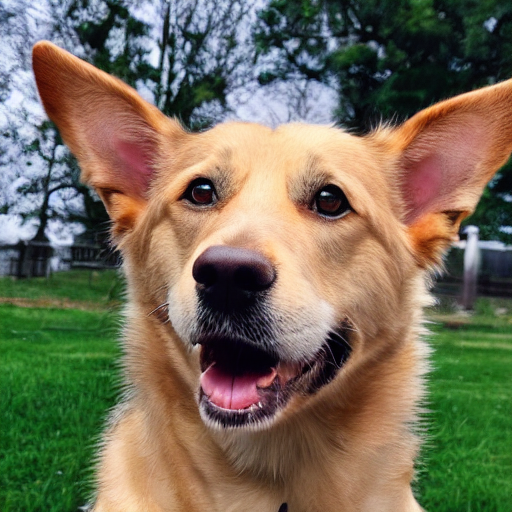

In [115]:
images[89]

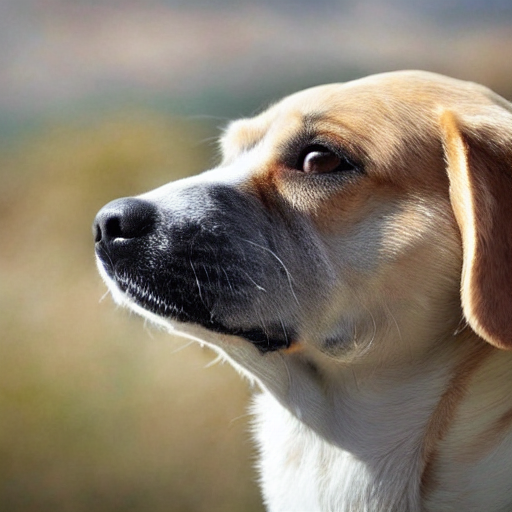

In [116]:
images[21]

In [134]:
j1, j2 = 3, 57#, 3 # 32, 65

# base point
h0 = inputs[21].mean(dim=0).cpu()    # image 6
h1 = inputs[89].mean(dim=0).cpu()   # image 95

# A: h0를 hyperplane j1 위로 정사영
w_j1, b_j1 = W2_topk[j1].cpu(), b2_topk[j1].cpu()
offset_A = (w_j1 @ h0 + b_j1) / (w_j1 @ w_j1)
A = h0 - offset_A * w_j1

# B: h0를 hyperplane j2 위로 정사영
w_j2, b_j2 = W2_topk[j2].cpu(), b2_topk[j2].cpu()
offset_B = (w_j2 @ h1 + b_j2) / (w_j2 @ w_j2)
B = h1 - offset_B * w_j2

# 방향벡터
AB = B - A
ab_len = AB.norm().item()
d = AB / ab_len
print(f'|AB| = {ab_len:.3f}')

|AB| = 3.393


In [135]:
denom = W2_topk.cpu() @ d                       # (K,)
numer = -(W2_topk.cpu() @ A + b2_topk.cpu())    # (K,)

alphas_intersection = []
distances_intersection = []
neuron_ids = []

for i in range(K):
    if abs(denom[i].item()) < 1e-8:
        continue
    dist = (numer[i] / denom[i]).item()         # A로부터의 유클리드 거리
    if 0.0 <= dist <= ab_len:                     # A~B 선분 안에 있는 것만
        alphas_intersection.append(dist / ab_len) # 정규화 α ∈ [0, 1]
        distances_intersection.append(dist)
        neuron_ids.append(i)

alphas = np.array(alphas_intersection)
distances = np.array(distances_intersection)
print(f'alphas: {len(alphas)}개')

alphas: 12개


## dense & sparse 구간

In [136]:
print(f'|AB| = {AB.norm():.6f}')
print(f'shift at α=1.0 = {AB.norm():.6f}')
print(f'shift at α=0.5 = {(0.5 * AB).norm():.6f}')

|AB| = 3.392727
shift at α=1.0 = 3.392727
shift at α=0.5 = 1.696363


In [137]:
# 이미지들 사이의 평균 거리와 비교
h_per_image = inputs.mean(dim=1).cpu()  # (N, 1280)
diffs = h_per_image.unsqueeze(0) - h_per_image.unsqueeze(1)  # (N, N, 1280)
pairwise_dist = diffs.norm(dim=-1)  # (N, N)

print(f'이미지 간 평균 거리: {pairwise_dist.mean():.3f}')
print(f'이미지 간 최대 거리: {pairwise_dist.max():.3f}')
print(f'이미지 간 최소 거리: {pairwise_dist[pairwise_dist > 0].min():.3f}')
print(f'|AB|: {AB.norm():.3f}')

이미지 간 평균 거리: 4.426
이미지 간 최대 거리: 7.543
이미지 간 최소 거리: 2.029
|AB|: 3.393


In [138]:
print(f'|h0| = {h0.norm():.3f}')
print(f'ratio = {AB.norm() / h0.norm():.6f}')

|h0| = 6.514
ratio = 0.520862


# 구간 내 샘플링

In [139]:
A_t = A.detach().float().reshape(-1)
B_t = B.detach().float().reshape(-1)
AB_vec = B_t - A_t
ab_len_sq = (AB_vec @ AB_vec).clamp_min(1e-8)

H_MEAN = inputs.mean(dim=(0, 1)).cpu()
H_STD = inputs.std(dim=(0, 1)).cpu()

N_POOL = 5000
N_GEN = 1
NCOLS = 10
SEED_POOL = 42

In [140]:
def alpha_from_h(h: torch.Tensor) -> torch.Tensor:
    return ((h - A_t.unsqueeze(0)) @ AB_vec) / ab_len_sq


def sample_h_in_band(lo: float, hi: float):
    g = torch.Generator().manual_seed(SEED_POOL)
    h_pool = H_MEAN.unsqueeze(0) + torch.randn(N_POOL, H_MEAN.shape[0], generator=g) * H_STD
    a_pool = alpha_from_h(h_pool)
    mask = (a_pool >= lo) & (a_pool <= hi)
    return h_pool[mask], a_pool[mask]


def sample_h_in_band_direct(lo, hi, n=N_POOL):
    # AB 방향: lo~hi 사이 균일 샘플
    alphas = torch.FloatTensor(n).uniform_(lo, hi)
    h_on_line = A_t.unsqueeze(0) + alphas.unsqueeze(1) * AB_vec.unsqueeze(0)  # (n, 1280)

    # AB에 수직인 방향으로만 노이즈
    g = torch.Generator().manual_seed(SEED_POOL)
    noise = torch.randn(n, 1280, generator=g) * H_STD
    # AB 방향 성분 제거
    noise_ab = (noise @ AB_vec / ab_len_sq).unsqueeze(1) * AB_vec.unsqueeze(0)
    noise_perp = noise - noise_ab

    h_band = h_on_line #+ noise_perp #* 0.7
    alpha_band = alphas
    return h_band, alpha_band


def generate_with_shift(h_target: torch.Tensor, seed: int) -> Image.Image:
    shift = h_target.to(DEVICE) - A.to(DEVICE)

    def hook(module, inp):
        x = inp[0].clone()
        x[1] = x[1] + shift.unsqueeze(0)
        return (x,)

    block = get_target_block(pipe.unet, TARGET_BLOCK)
    handle = block.register_forward_pre_hook(hook)
    try:
        out = pipe(
            prompt=PROMPT,
            negative_prompt=NEGATIVE_PROMPT,
            num_inference_steps=NUM_INFERENCE_STEPS,
            guidance_scale=GUIDANCE_SCALE,
            generator=torch.Generator(device='cpu').manual_seed(int(seed)),
            output_type='pil',
        )
    finally:
        handle.remove()
    return out.images[0]


def show_image_grid(images, alphas, title: str):
    n = len(images)
    if n == 0:
        print(f'{title}: 표시할 이미지 없음')
        return
    ncols = min(NCOLS, n)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(2.2 * ncols, 3* nrows))
    axes = np.atleast_2d(axes)
    for ax, img, a in zip(axes.flat, images, alphas):
        ax.imshow(img)
        ax.set_title(f'α={float(a):.3f}', fontsize=8)
        ax.axis('off')
    for ax in axes.flat[n:]:
        ax.axis('off')
    fig.suptitle(title, fontsize=11)
    plt.tight_layout()
    plt.show()


def run_band(lo: float, hi: float, seed=SEED_BASE):
    # h_band, alpha_band = sample_h_in_band(lo, hi)
    h_band, alpha_band = sample_h_in_band_direct(lo, hi)

    print(f'α∈[{lo}, {hi}]  pool={len(h_band)}/{N_POOL}')
    if len(h_band) == 0:
        print('해당 구간 샘플 없음. 구간을 조정하세요.')
        return
    n_gen = min(N_GEN, len(h_band))
    pick = torch.randperm(len(h_band))[:n_gen].tolist()
    pick = sorted(pick, key=lambda idx: float(alpha_band[idx]))
    imgs = [
        generate_with_shift(h_band[int(idx)], int(seed)) # + j)
        for j, idx in enumerate(pick)
    ]
    show_image_grid(imgs, alpha_band[pick], f'α∈[{lo}, {hi}] ({n_gen} images)')
    return alpha_band[pick]

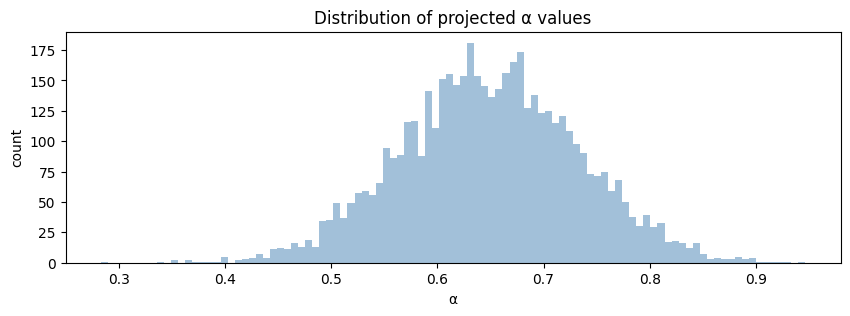

In [141]:
def temp_sample_h_in_band(lo: float, hi: float):
    g = torch.Generator().manual_seed(SEED_POOL)
    h_pool = H_MEAN.unsqueeze(0) + torch.randn(N_POOL, H_MEAN.shape[0], generator=g) * H_STD
    a_pool = alpha_from_h(h_pool)
    mask = (a_pool >= lo) & (a_pool <= hi)
    return h_pool[mask], a_pool[mask]
h_pool, a_pool = temp_sample_h_in_band(0, 1)

plt.figure(figsize=(10, 3))
plt.hist(alpha_from_h(h_pool).numpy(), bins=100, color='steelblue', alpha=0.5)
plt.xlabel('α')
plt.ylabel('count')
plt.title('Distribution of projected α values')
plt.show()

In [142]:
p1, p2 = 0.04, 0.09
p3, p4 = 0.23, 0.28
p5, p6 = 0.34, 0.39
p7, p8 = 0.49, 0.54
p9, p10 = 0.68, 0.73
p11, p12 = 0.78, 0.83

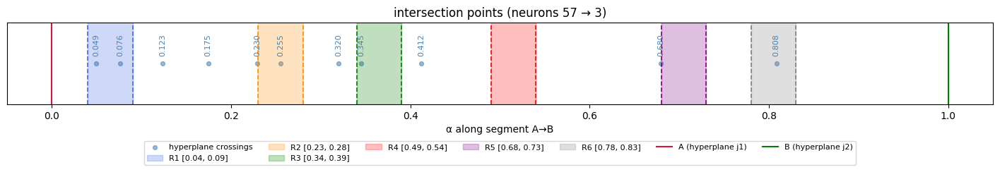

In [129]:
BANDS = [
    {'name': 'R1',  'lo': p1, 'hi': p2, 'color': 'royalblue'},
    {'name': 'R2', 'lo': p3, 'hi': p4, 'color': 'darkorange'},
    {'name': 'R3', 'lo': p5, 'hi': p6, 'color': 'green'},
    {'name': 'R4', 'lo': p7, 'hi': p8, 'color': 'red'},
    {'name': 'R5', 'lo': p9, 'hi': p10, 'color': 'purple'},
    {'name': 'R6', 'lo': p11, 'hi': p12, 'color': 'grey'},
]

fig, ax = plt.subplots(figsize=(18, 1.5))

# hyperplane 교차점
if 'alphas' in globals() and len(alphas):
    ax.scatter(alphas, np.zeros_like(alphas), s=18, c='steelblue', alpha=0.55, label='hyperplane crossings')
    for a in alphas:
        ax.annotate(f"{a:.3f}", (a, 0), xytext=(0, 7), textcoords='offset points', 
                    ha='center', va='bottom', fontsize=8, color='steelblue', rotation=90)

for b in BANDS:
    ax.axvspan(b['lo'], b['hi'], color=b['color'], alpha=0.25, label=f"{b['name']} [{b['lo']}, {b['hi']}]")
    ax.axvline(b['lo'], color=b['color'], lw=1.2, ls='--')
    ax.axvline(b['hi'], color=b['color'], lw=1.2, ls='--')

ax.axvline(0, color='crimson', lw=1.5, ls='-', label='A (hyperplane j1)')
ax.axvline(1, color='green', lw=1.5, ls='-', label='B (hyperplane j2)')

# # alpha
# for i, v in enumerate(den_alphas):
#     ax.axvline(v.item(), color='royalblue', lw=1.5, ls='-', label='dense' if i == 0 else None)
# for i, v in enumerate(spa_alphas):
#     ax.axvline(v.item(), color='darkorange', lw=1.5, ls='-', label='sparse' if i == 0 else None)

ax.set_xlim(-0.05, 1.05)
ax.set_xlabel('α along segment A→B')
ax.set_yticks([])
ax.set_title(f'intersection points (neurons {j1} → {j2})')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4),  ncol=7, fontsize=8)
# plt.tight_layout()
plt.show()

In [83]:
print('dense:', ', '.join(f"{a:.3f}" for a in alphas[(alphas >= p1) & (alphas <= p2)]))
print('sparse:', ', '.join(f"{a:.3f}" for a in alphas[(alphas >= p3) & (alphas <= p4)]))

dense: 0.090, 0.041
sparse: 


α∈[0.04, 0.09]  pool=5000/5000


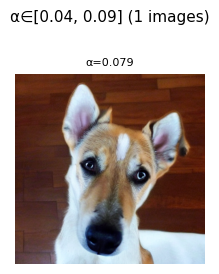

α∈[0.23, 0.28]  pool=5000/5000


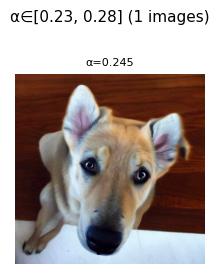

α∈[0.34, 0.39]  pool=5000/5000


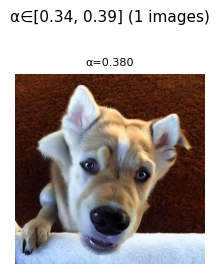

α∈[0.49, 0.54]  pool=5000/5000


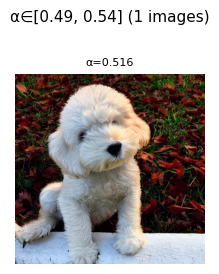

α∈[0.68, 0.73]  pool=5000/5000


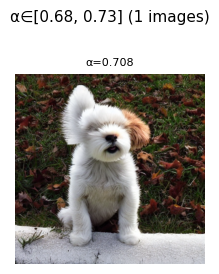

α∈[0.78, 0.83]  pool=5000/5000


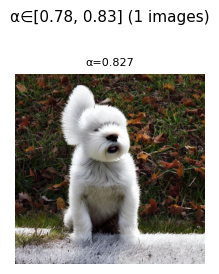

tensor([0.8269])

In [84]:
run_band(p1, p2, seed=1002)
run_band(p3, p4, seed=1002)
run_band(p5, p6, seed=1002)
run_band(p7, p8, seed=1002)
run_band(p9, p10, seed=1002)
run_band(p11, p12, seed=1002)

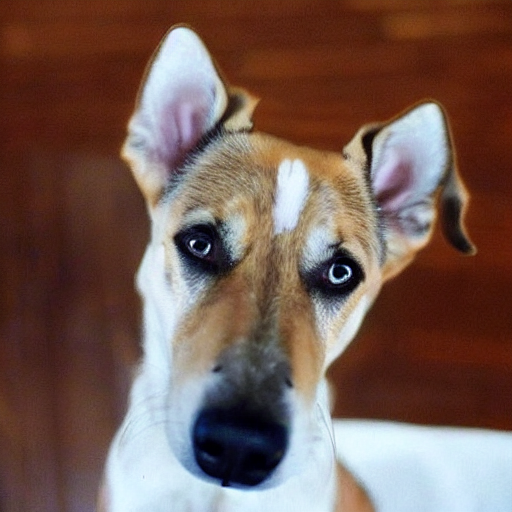

In [274]:
images[2]

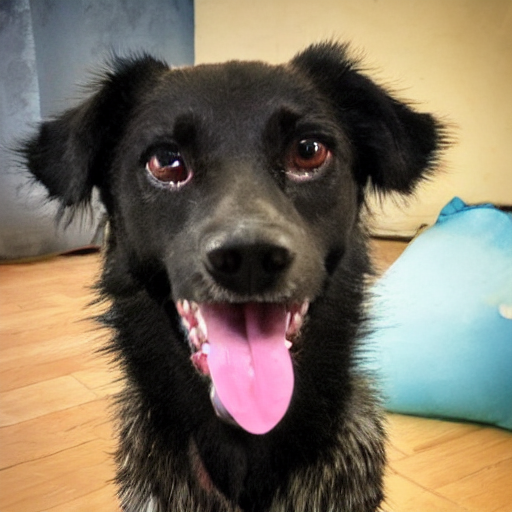

In [272]:
images[91]

In [268]:
N_GEN = 30

p1, p2 = 0.40, 0.5
p3, p4 = 0.50, 0.6
# p5, p6 = 0.277, 0.323
# p7, p8 = 0.52, 0.57
# p9, p10 = 0.7, 0.75

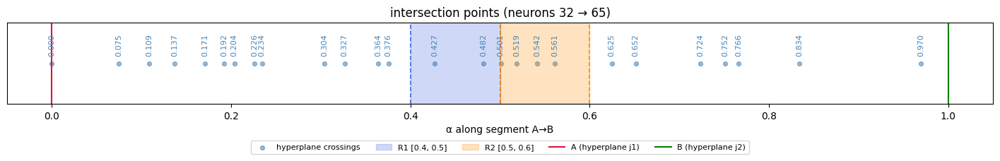

In [269]:
BANDS = [
    {'name': 'R1',  'lo': p1, 'hi': p2, 'color': 'royalblue'},
    {'name': 'R2', 'lo': p3, 'hi': p4, 'color': 'darkorange'},
    # {'name': 'R3', 'lo': p5, 'hi': p6, 'color': 'green'},
    # {'name': 'R4', 'lo': p7, 'hi': p8, 'color': 'red'},
    # {'name': 'R5', 'lo': p9, 'hi': p10, 'color': 'purple'},
]

fig, ax = plt.subplots(figsize=(18, 1.5))

# hyperplane 교차점
if 'alphas' in globals() and len(alphas):
    ax.scatter(alphas, np.zeros_like(alphas), s=18, c='steelblue', alpha=0.55, label='hyperplane crossings')
    for a in alphas:
        ax.annotate(f"{a:.3f}", (a, 0), xytext=(0, 7), textcoords='offset points', 
                    ha='center', va='bottom', fontsize=8, color='steelblue', rotation=90)

for b in BANDS:
    ax.axvspan(b['lo'], b['hi'], color=b['color'], alpha=0.25, label=f"{b['name']} [{b['lo']}, {b['hi']}]")
    ax.axvline(b['lo'], color=b['color'], lw=1.2, ls='--')
    ax.axvline(b['hi'], color=b['color'], lw=1.2, ls='--')

ax.axvline(0, color='crimson', lw=1.5, ls='-', label='A (hyperplane j1)')
ax.axvline(1, color='green', lw=1.5, ls='-', label='B (hyperplane j2)')

# # alpha
# for i, v in enumerate(den_alphas):
#     ax.axvline(v.item(), color='royalblue', lw=1.5, ls='-', label='dense' if i == 0 else None)
# for i, v in enumerate(spa_alphas):
#     ax.axvline(v.item(), color='darkorange', lw=1.5, ls='-', label='sparse' if i == 0 else None)

ax.set_xlim(-0.05, 1.05)
ax.set_xlabel('α along segment A→B')
ax.set_yticks([])
ax.set_title(f'intersection points (neurons {j1} → {j2})')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4),  ncol=7, fontsize=8)
# plt.tight_layout()
plt.show()

In [104]:
# run_band(p1, p2, seed=1002)
# run_band(p3, p4, seed=1002)

In [60]:

# 법선 벡터 간 cosine similarity가 0에 가까운 쌍 찾기
W_norm = W2_topk / W2_topk.norm(dim=1, keepdim=True)
cos_sim = W_norm @ W_norm.T  # (K, K)

# cosine sim이 0에 가까운 쌍 상위 10개
cos_abs = cos_sim.abs().triu(diagonal=1)
low_cos = (1 - cos_abs).triu(diagonal=1)
top_perp = low_cos.flatten().topk(10).indices
for idx in top_perp:
    i, j = idx.item() // K, idx.item() % K
    print(f'neuron {i} ↔ {j}  cos_sim={cos_sim[i,j]:.3f}')


neuron 71 ↔ 85  cos_sim=0.000
neuron 75 ↔ 85  cos_sim=0.000
neuron 20 ↔ 33  cos_sim=0.000
neuron 52 ↔ 77  cos_sim=0.000
neuron 14 ↔ 24  cos_sim=-0.000
neuron 3 ↔ 86  cos_sim=0.000
neuron 71 ↔ 96  cos_sim=-0.000
neuron 66 ↔ 81  cos_sim=0.000
neuron 28 ↔ 39  cos_sim=0.000
neuron 34 ↔ 95  cos_sim=0.000


# 다시

In [ ]:
# 1. 랜덤 이미지 N장 생성하면서 activation 캡처
N_RANDOM = 500
random_images = []
random_acts = []

block = get_target_block(pipe.unet, TARGET_BLOCK)
block._forward_pre_hooks.clear() # 이전 예외 실행에서 남은 pre-hook 정리

for seed in range(N_RANDOM):
    act_state = {}

    # pre-hook은 (module, inputs)만 받음
    def capture_hook(module, inp):
        x = inp[0]
        act_state['act'] = x[1].mean(dim=0).detach().cpu()  # cond, spatial mean

    handle = block.register_forward_pre_hook(capture_hook)
    try:
        generator = torch.Generator(device='cpu').manual_seed(seed)
        result = pipe(
            prompt=PROMPT,
            negative_prompt=NEGATIVE_PROMPT,
            num_inference_steps=NUM_INFERENCE_STEPS,
            guidance_scale=GUIDANCE_SCALE,
            generator=generator,
            output_type='pil'
        )
    finally:
        handle.remove()

    if 'act' not in act_state:
        continue

    random_images.append(result.images[0])
    random_acts.append(act_state['act'])

random_acts = torch.stack(random_acts)  # (N, 1280)


# 2. AB 선분 위로 projection -> alpha 계산
h_rel = random_acts - A_t.unsqueeze(0)
alpha_random = (h_rel @ AB_vec) / ab_len_sq  # (N,)

In [51]:
dir = '/project/dam/save/'
os.makedirs(dir, exist_ok=True)
torch.save(random_acts, os.path.join(dir, 'dog_random_acts.pt')) # save

random_acts = torch.load(os.path.join(dir, 'dog_random_acts.pt')) # load

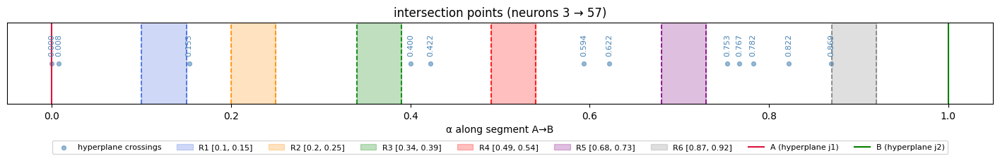

In [143]:
p1, p2 = 0.1, 0.15
p3, p4 = 0.2, 0.25
p5, p6 = 0.34, 0.39
p7, p8 = 0.49, 0.54
p9, p10 = 0.68, 0.73
p11, p12 = 0.87, 0.92

BANDS = [
    {'name': 'R1',  'lo': p1, 'hi': p2, 'color': 'royalblue'}, # royalblue
    {'name': 'R2', 'lo': p3, 'hi': p4, 'color': 'darkorange'}, # darkorange
    {'name': 'R3', 'lo': p5, 'hi': p6, 'color': 'green'},
    {'name': 'R4', 'lo': p7, 'hi': p8, 'color': 'red'},
    {'name': 'R5', 'lo': p9, 'hi': p10, 'color': 'purple'},
    {'name': 'R6', 'lo': p11, 'hi': p12, 'color': 'grey'},
]

fig, ax = plt.subplots(figsize=(18, 1.5))

# hyperplane 교차점
if 'alphas' in globals() and len(alphas):
    ax.scatter(alphas, np.zeros_like(alphas), s=18, c='steelblue', alpha=0.55, label='hyperplane crossings')
    for a in alphas:
        ax.annotate(f"{a:.3f}", (a, 0), xytext=(0, 7), textcoords='offset points', 
                    ha='center', va='bottom', fontsize=8, color='steelblue', rotation=90)

for b in BANDS:
    ax.axvspan(b['lo'], b['hi'], color=b['color'], alpha=0.25, label=f"{b['name']} [{b['lo']}, {b['hi']}]")
    ax.axvline(b['lo'], color=b['color'], lw=1.2, ls='--')
    ax.axvline(b['hi'], color=b['color'], lw=1.2, ls='--')

ax.axvline(0, color='crimson', lw=1.5, ls='-', label='A (hyperplane j1)')
ax.axvline(1, color='green', lw=1.5, ls='-', label='B (hyperplane j2)')

ax.set_xlim(-0.05, 1.05)
ax.set_xlabel('α along segment A→B')
ax.set_yticks([])
ax.set_title(f'intersection points (neurons {j1} → {j2})')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4),  ncol=len(BANDS)+3, fontsize=8)
plt.show()

In [144]:
def get_sorted_band_samples(images, alphas, lo, hi):
    mask = (alphas >= lo) & (alphas <= hi)
    band_images = [img for img, m in zip(images, mask) if m]
    band_alphas = alphas[mask]

    if len(band_alphas) == 0:
        return mask.sum().item(), [], band_alphas

    sort_idx = band_alphas.argsort()
    band_alphas = band_alphas[sort_idx]
    band_images = [band_images[i] for i in sort_idx]
    return mask.sum().item(), band_images, band_alphas


def plot_band_images(images, alphas, lo, hi, label, *, max_images=20, max_cols=10):
    total, band_images, band_alphas = get_sorted_band_samples(images, alphas, lo, hi)

    print(f"[{label}] {total} / {N_RANDOM} 이미지가 α∈[{lo}, {hi}] 구간에 있음")
    if total == 0:
        print("  -> 해당 구간에 이미지가 없습니다.")
        return

    n_show = min(total, max_images)
    pick = np.linspace(0, total - 1, n_show).round().astype(int)
    pick = np.unique(pick)
    band_images = [band_images[i] for i in pick]
    band_alphas = band_alphas[pick]
    n_show = len(pick)

    cols = min(n_show, max_cols)
    rows = (n_show + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(2.5 * cols, 3 * rows))
    axes = np.array(axes).reshape(rows, cols)

    for idx, (img, a) in enumerate(zip(band_images, band_alphas)):
        r, c = divmod(idx, cols)
        ax = axes[r, c]
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"α={a:.3f}", fontsize=8)

    for idx in range(n_show, rows * cols):
        r, c = divmod(idx, cols)
        axes[r, c].axis("off")

    fig.suptitle(f"{label}: α in [{lo}, {hi}]  (showing {n_show}/{total})", fontsize=11)
    plt.tight_layout()
    plt.show()

In [ ]:
# 3. 구간별 필터링/정렬
RANGES = [
    ("R1", p1, p2),
    ("R2", p3, p4),
    ("R3", p5, p6),
    ("R4", p7, p8),
    ("R5", p9, p10),
    ("R6", p11, p12),
]

# 4. 모든 p 구간 실행
MAX_IMAGES = 20
for label, lo, hi in RANGES:
    plot_band_images(
        random_images,
        alpha_random,
        lo,
        hi,
        label,
        max_images=MAX_IMAGES,
        max_cols=10,
    )

[R1] 23 / 500 이미지가 α∈[0.1, 0.15] 구간에 있음


In [59]:
# # AB 직선 위의 점에서 직접 이미지 생성
# # (원본 분포가 아니라, AB 위 alpha 지점 자체를 주입해서 생성)

# def generate_on_AB(alpha, seed=SEED_BASE):
#     """AB 직선 위 alpha 위치의 점 h = A + alpha*(B-A) 를 주입해 이미지 생성"""
#     h_target = A_t + float(alpha) * AB_vec
#     return generate_with_shift(h_target, seed)


# def run_band_on_line(lo, hi, label="", *, n_images=20, seed=SEED_BASE):
#     """구간 [lo, hi]를 n_images개로 균등 분할한 AB 위 지점들에서 생성"""
#     alphas = np.linspace(lo, hi, n_images)
#     imgs = [generate_on_AB(a, seed) for a in alphas]
#     show_image_grid(imgs, alphas, f"{label}  α∈[{lo}, {hi}] — on AB line ({n_images} pts)")
#     return alphas


# # 모든 p 구간을 AB 직선 위에서 실행
# MAX_IMAGES = 20  # 구간당 생성/표시할 이미지 개수
# for label, lo, hi in RANGES:
#     run_band_on_line(lo, hi, label, n_images=MAX_IMAGES, seed=SEED_BASE)

# 두 이미지 interpolation → A+alpha 샘플링

In [212]:
temp_seed = SEED_BASE+2
temp_prompt = [
    "a dog lying completely flat on the ground",
    "a full-body dog in clear view"
]

generator = torch.Generator(device="cpu")
ff_block = get_target_block(pipe.unet, TARGET_BLOCK)
inject_module = get_target_block(pipe.unet, INJECT_BLOCK)

capture_hook, capture_state = make_forward_activation_hook_at_step(CAPTURE_STEP)
ff_handle = ff_block.register_forward_hook(capture_hook)

images, activations_per_image = [], []
for p_idx, prompt in enumerate(temp_prompt):
    seed = temp_seed
    generator.manual_seed(seed)

    capture_state["forward_i"] = -1
    capture_state["value"] = None

    result = pipe(
        prompt=prompt,
        negative_prompt=NEGATIVE_PROMPT,
        num_inference_steps=NUM_INFERENCE_STEPS,
        guidance_scale=GUIDANCE_SCALE,
        num_images_per_prompt=1,
        generator=generator,
        output_type="pil",
    )
    img = result["images"][0] if isinstance(result, dict) else result.images[0]
    images.append(img)
    activations_per_image.append(capture_state["value"])

ff_handle.remove()


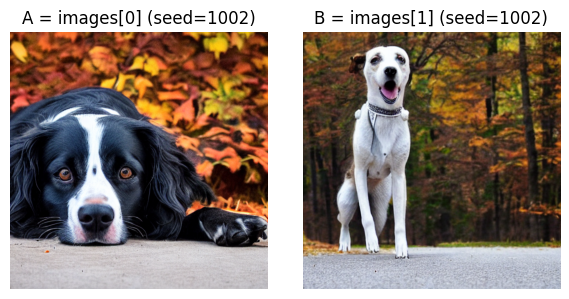

|AB| = 4.2941
A from temp activations[0], NOT inputs[0] (dataset seed=1000)


In [213]:
idx_A, idx_B = 0, 1

fig, axes = plt.subplots(1, 2, figsize=(6, 3))
for ax, idx, label in zip(axes, (idx_A, idx_B), ("A", "B")):
    ax.imshow(images[idx])
    ax.set_title(f"{label} = images[{idx}] (seed={temp_seed})")
    ax.axis("off")
plt.tight_layout()
plt.show()

def act_to_h(act_dict):
    x = act_dict["input"]
    if isinstance(x, torch.Tensor):
        t = x.float()
    else:
        t = x[0].float() if isinstance(x, (list, tuple)) else torch.as_tensor(x).float()
    if t.dim() == 3:
        t = t[1] if t.shape[0] == 2 else t[0]  # CFG batch면 cond=1
    return t.mean(dim=0).cpu()  # (1280,)

A = act_to_h(activations_per_image[idx_A])
B = act_to_h(activations_per_image[idx_B])

A_t = A.reshape(-1)
B_t = B.reshape(-1)
AB_vec = B_t - A_t
ab_len_sq = (AB_vec @ AB_vec).clamp_min(1e-8)
ab_len = AB_vec.norm().item()

print(f"|AB| = {ab_len:.4f}")
print(f"A from temp activations[{idx_A}], NOT inputs[{idx_A}] (dataset seed={SEED_BASE + idx_A})")


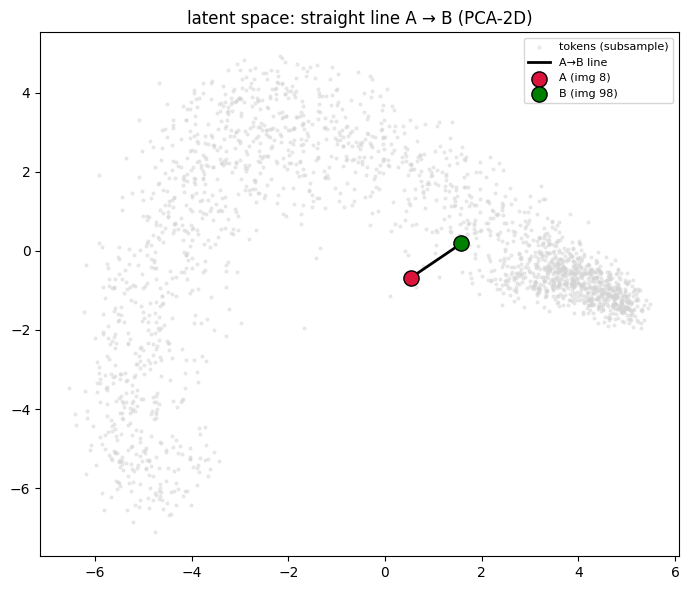

In [214]:
N_LINE = 11
alphas_line = np.linspace(0.0, 1.0, N_LINE)

line_latents = torch.stack([A_t + float(a) * AB_vec for a in alphas_line])  # (N_LINE, 1280)

if "h_2d" not in globals() or "pca_act" not in globals():
    h_all = inputs.reshape(-1, inputs.shape[-1]).cpu().numpy()
    pca_act = PCA(n_components=2)
    h_2d = pca_act.fit_transform(h_all)

A_2d = pca_act.transform(A.numpy().reshape(1, -1))[0]
B_2d = pca_act.transform(B.numpy().reshape(1, -1))[0]
line_2d = pca_act.transform(line_latents.numpy())

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(h_2d[::50, 0], h_2d[::50, 1], s=4, c="lightgray", alpha=0.4, label="tokens (subsample)")
ax.plot(line_2d[:, 0], line_2d[:, 1], "k-", lw=2, label="A→B line")
ax.scatter([A_2d[0]], [A_2d[1]], s=120, c="crimson", edgecolors="k", zorder=5, label="A (img 8)")
ax.scatter([B_2d[0]], [B_2d[1]], s=120, c="green", edgecolors="k", zorder=5, label="B (img 98)")
# for a, p in zip(alphas_line, line_2d):
#     ax.annotate(f"{a:.2f}", p, fontsize=7, alpha=0.85, rotation=90)
ax.set_title("latent space: straight line A → B (PCA-2D)")
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

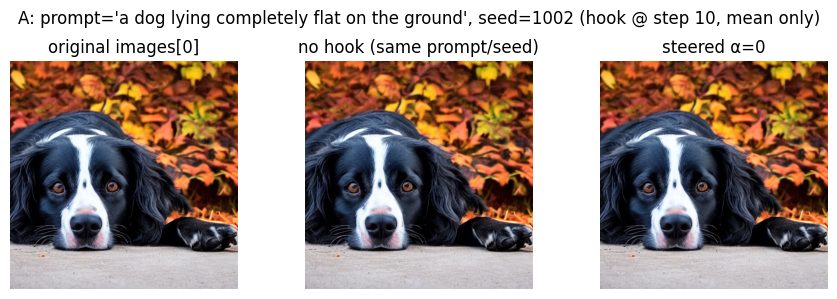

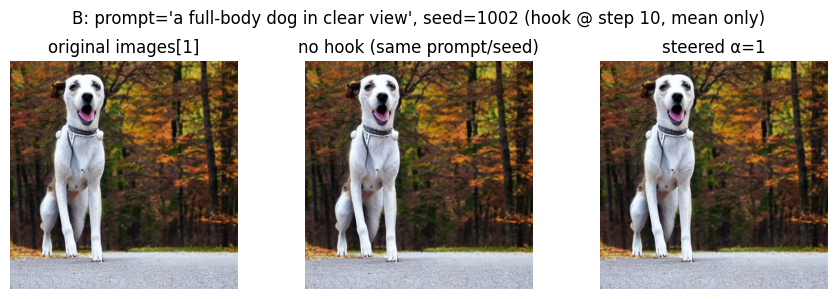

In [227]:
def _shift_ff_cond_hidden(hidden: torch.Tensor, h_target: torch.Tensor) -> torch.Tensor:
    """CFG면 cond=batch[1], gs=1이면 batch[0]. spatial mean만 h_target에 맞춤."""
    out = hidden.clone()
    if out.shape[0] >= 2:
        cond = out[1]
        out[1] = cond + (h_target - cond.mean(dim=0))
    else:
        cond = out[0]
        out[0] = cond + (h_target - cond.mean(dim=0))
    return out


def _encode_cond_uncond(prompt: str) -> tuple[torch.Tensor, torch.Tensor]:
    """pipe._encode_prompt 반환값 분리. CFG면 (uncond, cond) 각 (1, seq, dim)."""
    pe = pipe._encode_prompt(
        prompt,
        DEVICE,
        num_images_per_prompt=1,
        do_classifier_free_guidance=GUIDANCE_SCALE > 1.0,
        negative_prompt=NEGATIVE_PROMPT,
    )
    if GUIDANCE_SCALE > 1.0 and pe.shape[0] >= 2:
        return pe[:1], pe[1:2]
    return None, pe


def _blend_cfg_prompt_embeds(alpha: float) -> tuple[torch.Tensor | None, torch.Tensor]:
    """α=0 → prompt[0], α=1 → prompt[1]. cond만 보간, uncond는 prompt[0] 것 사용."""
    u0, c0 = _encode_cond_uncond(temp_prompt[0])
    _, c1 = _encode_cond_uncond(temp_prompt[1])
    cond = (1.0 - float(alpha)) * c0 + float(alpha) * c1
    return u0, cond


def generate_on_AB_line(
    alpha,
    seed,
    *,
    prompt: str | None = None,
    prompt_embeds: torch.Tensor | None = None,
    apply_hook: bool = True,
) -> Image.Image:
    """h_target = A + α(B-A). prompt / prompt_embeds 중 하나만 지정."""
    h_target = (A_t + float(alpha) * AB_vec).to(DEVICE)
    if prompt_embeds is None:
        prompt = temp_prompt[0] if prompt is None else prompt
    step_state = {"i": -1}

    def hook(module, inp):
        step_state["i"] += 1
        if step_state["i"] != CAPTURE_STEP:
            return None
        hidden = inp[0]
        return (_shift_ff_cond_hidden(hidden, h_target),)

    block = get_target_block(pipe.unet, TARGET_BLOCK)
    handle = None
    if apply_hook:
        handle = block.register_forward_pre_hook(hook)
    pipe_kwargs = dict(
        negative_prompt=NEGATIVE_PROMPT,
        num_inference_steps=NUM_INFERENCE_STEPS,
        guidance_scale=GUIDANCE_SCALE,
        generator=torch.Generator(device="cpu").manual_seed(int(seed)),
        output_type="pil",
    )
    if prompt_embeds is not None:
        pipe_kwargs["prompt"] = None
        pipe_kwargs["negative_prompt"] = None
        if isinstance(prompt_embeds, tuple):
            uncond_pe, cond_pe = prompt_embeds
            if uncond_pe is not None:
                pipe_kwargs["negative_prompt_embeds"] = uncond_pe.to(DEVICE)
            pipe_kwargs["prompt_embeds"] = cond_pe.to(DEVICE)
        else:
            pipe_kwargs["prompt_embeds"] = prompt_embeds.to(DEVICE)
    else:
        pipe_kwargs["prompt"] = prompt
    try:
        out = pipe(**pipe_kwargs)
    finally:
        if handle is not None:
            handle.remove()
    return out.images[0]


# sanity: endpoint마다 해당 prompt (α=1은 images[1]과 맞추려면 prompt[1] 필수)
for alpha, idx, label in [(0, idx_A, "A"), (1, idx_B, "B")]:
    gen = generate_on_AB_line(
        alpha, seed=temp_seed, prompt=temp_prompt[idx], apply_hook=True
    )
    gen_no_hook = generate_on_AB_line(
        alpha, seed=temp_seed, prompt=temp_prompt[idx], apply_hook=False
    )
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    axes[0].imshow(images[idx])
    axes[0].set_title(f"original images[{idx}]")
    axes[0].axis("off")
    axes[1].imshow(gen_no_hook)
    axes[1].set_title("no hook (same prompt/seed)")
    axes[1].axis("off")
    axes[2].imshow(gen)
    axes[2].set_title(f"steered α={alpha}")
    axes[2].axis("off")
    fig.suptitle(
        f"{label}: prompt={temp_prompt[idx]!r}, seed={temp_seed} "
        f"(hook @ step {CAPTURE_STEP}, mean only)"
    )
    plt.tight_layout()
    plt.show()


In [228]:
# line sweep 모드 (cross-prompt A/B일 때 "fixed"는 α와 무관하게 거의 동일 이미지)
# - "blend": prompt_embeds를 α로 보간 + activation steering (권장)
# - "fixed": temp_prompt[0] 고정 (GUIDE식, A/B가 같은 prompt일 때만 의미 있음)
LINE_PROMPT_MODE = "blend"  # "blend" | "fixed"

line_images = []
for a in alphas_line:
    if LINE_PROMPT_MODE == "blend":
        pe = _blend_cfg_prompt_embeds(a)  # (uncond, cond)
        img = generate_on_AB_line(a, seed=temp_seed, prompt_embeds=pe)
    elif LINE_PROMPT_MODE == "fixed":
        img = generate_on_AB_line(a, seed=temp_seed, prompt=temp_prompt[0])
    else:
        raise ValueError(LINE_PROMPT_MODE)
    line_images.append(img)

print(f"line_images: N={len(line_images)}, mode={LINE_PROMPT_MODE!r}, seed={temp_seed}")


line_images: N=11, mode='blend', seed=1002


hyperplane crossings on A→B: 13 / 100
|signed_dist| at crossings (mean): 0.0000


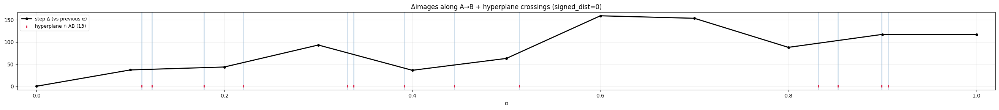

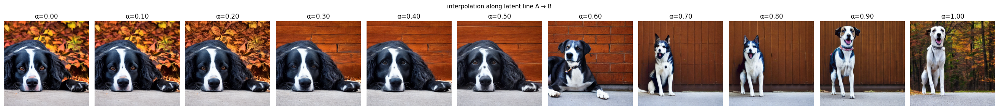

In [229]:
# --- line_images: α에 따른 변화량 (실선) + AB 선분과 hyperplane 교점 ---
imgs_np = np.stack([
    np.asarray(img.convert("RGB"), dtype=np.float32).ravel() / 255.0
    for img in line_images
])  # (N, H*W*3)

step_delta = np.zeros(len(alphas_line))
for i in range(1, len(imgs_np)):
    step_delta[i] = np.linalg.norm(imgs_np[i] - imgs_np[i - 1])

# --- hyperplane ∩ segment A→B (mean activation 직선) ---
# h(α) = A + α(B-A), hyperplane k: w_k·h + b_k = 0  ⇔  signed_dist_mean(h)=0
W = W2_topk.cpu().float()
b = b2_topk.cpu().float()
# W2_topk = W2 전체(5120)일 수 있음 → top_k_idx로 K개만 쓰기
if W.shape[0] != K:
    if "top_k_idx" not in globals():
        raise ValueError(f"W2_topk.shape[0]={W.shape[0]} but K={K}; run top-k cell or index W2_topk")
    sel = top_k_idx.cpu().long()
    W, b = W[sel], b[sel]
K_hp = W.shape[0]

A_cpu = A.cpu().float()
B_cpu = B.cpu().float()
AB_cpu = AB_vec.cpu().float()

denom = W @ AB_cpu  # (K_hp,)
numer = -(W @ A_cpu + b)
alpha_hp = torch.full((K_hp,), float("nan"))
ok = denom.abs() > 1e-8
alpha_hp[ok] = numer[ok] / denom[ok]

in_segment = ok & (alpha_hp >= 0.0) & (alpha_hp <= 1.0)
alphas_cross = alpha_hp[in_segment].numpy()
neurons_cross = in_segment.nonzero(as_tuple=True)[0].numpy()

# 교점에서 signed_dist 검증 (mean h)
h_cross = A_cpu.unsqueeze(0) + torch.from_numpy(alphas_cross).float().unsqueeze(1) * AB_cpu.unsqueeze(0)
sd_cross = (h_cross @ W.T + b) / W.norm(dim=-1)  # (n_cross, K_hp)
sd_on_plane = sd_cross[torch.arange(len(alphas_cross)), torch.from_numpy(neurons_cross)]

print(f"hyperplane crossings on A→B: {len(alphas_cross)} / {K_hp}")
print(f"|signed_dist| at crossings (mean): {sd_on_plane.abs().mean().item():.4f}")

# --- plot ---
n_show = len(alphas_line)
fig, ax = plt.subplots(figsize=(2.4 * ncols, 3))
ax.plot(alphas_line, step_delta, "k-", lw=2, marker="o", ms=4, label="step Δ (vs previous α)")

# 교점: α 위치에 세로선 (다른 hyperplane)
for a in alphas_cross:
    ax.axvline(float(a), color="steelblue", alpha=0.25, lw=2, zorder=0)

# 교점 마커 (y=0 기준, 아래쪽 눈금)
ax.scatter(
    alphas_cross,
    np.zeros_like(alphas_cross),
    s=22,
    c="crimson",
    marker="|",
    linewidths=2,
    label=f"hyperplane ∩ AB ({len(alphas_cross)})",
    zorder=3,
)

ax.set_xlim(-0.02, 1.02)
ax.set_xlabel("α")
ax.set_title("Δimages along A→B + hyperplane crossings (signed_dist=0)")
ax.legend(fontsize=9, loc="upper left")
ax.grid(True, alpha=0.25)
plt.tight_layout()
plt.show()

# --- line_images 그리드 ---
ncols = len(line_images)
fig, axes = plt.subplots(1, ncols, figsize=(2.4 * ncols, 3))
for ax, img, a in zip(axes, line_images, alphas_line):
    ax.imshow(img)
    ax.set_title(f"α={a:.2f}")
    ax.axis("off")
fig.suptitle("interpolation along latent line A → B", fontsize=11)
plt.tight_layout()
plt.show()
